# Final Course Project

Before processing with the network analysis and addressing with the AI diffusion problem of the company, we have proceeded some basic analysis to have a better understanding of the network. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from xml.dom import minidom
import seaborn as sns
import itertools


In [2]:
g = nx.read_graphml('trading_floor.xml')

## Descriptive statistics (shortest path)

The main basic analysis that has been through were descriptive statistics regarding the properties of the network and its centrality according to three different algorithms, degree, eigenvector and betweenness centrality. From the results obtained, we can perceive that it is not a random network since the distribution is not normal distributed, and there might be existence of hubs within the network, which would require further analysis to verify. 

In [3]:
# %% define the method to calculate summary stats
import numpy as np
import networkx as nx
from networkx.exception import NetworkXError
from networkx.algorithms.distance_measures import diameter
from networkx.algorithms.shortest_paths.generic import shortest_path
from networkx.generators.random_graphs import random_regular_graph, watts_strogatz_graph

class NetworkSummary:
    def __init__(self, graph: nx.Graph):
        self.graph = graph
        self.nodes = graph.nodes

    def summary(self):
        """
        Call this method to get summary statistics concerning all path length and shortest path length
        """
        shortest_path_stats = self.shortest_path_stats
        result = """
        Summary:
        The diameter of the network is {:}

        --------------------------------------------
        The stats summary of the shortest paths is in the below table:
        -----------------------------------
        Mean      :  {:.2f}
        Median    :  {:.2f}
        Variance  :  {:.2f}
        Max       :  {:.2f}
        Min       :  {:.2f}
        """.format(self.diameter, shortest_path_stats["mean"], shortest_path_stats["median"],
                   shortest_path_stats["variance"], shortest_path_stats["max"],
                   shortest_path_stats["min"])
        return result

    @property
    def diameter(self):
        """
        Calculate the diameter of the network
        """
        try:
            return diameter(self.graph)
        except NetworkXError:  # if the network is not connected
            return "Network unconnected"

    @property
    def shortest_path_stats(self):
        """
        Calculate the summary statistics concerning shortest path length
        """
        shortest_path_dict = shortest_path(self.graph)
        shortest_path_length = []
        for source_key, source_value in shortest_path_dict.items():
            # print(f"Start to calculate all possible path of source node:{source_key}")
            for target in source_value.items():
                # this is the nodes of shortest path, so we need to minus 1
                shortest_path_length.append(len(target[1]) - 1)
        shortest_path_length = np.array(list(filter(lambda x: x != 0, shortest_path_length)))
        return {"mean": shortest_path_length.mean(), "median": np.median(shortest_path_length),
                "variance": shortest_path_length.var(), "max": shortest_path_length.max(),
                "min": shortest_path_length.min()}
ns = NetworkSummary(g)
ns.summary()

'\n        Summary:\n        The diameter of the network is 9\n\n        --------------------------------------------\n        The stats summary of the shortest paths is in the below table:\n        -----------------------------------\n        Mean      :  4.70\n        Median    :  5.00\n        Variance  :  1.89\n        Max       :  9.00\n        Min       :  1.00\n        '

In [4]:
#Descriptive statistics of the network in terms of AI preference
import statistics as sta

sta_dict= dict(g.nodes(data='ai'))
mean = sta.mean(sta_dict.values())
median = sta.median(sta_dict.values())
mode = sta.mode(sta_dict.values())
std = sta.stdev(sta_dict.values())
var = sta.variance(sta_dict.values())

print ("The mean is " + str(mean))
print ("The median is " + str(median))
print ("The mode is " + str(mode))
print ("The std is " + str(std))
print ("The variance is " + str(var))

The mean is 4.6875
The median is 4.0
The mode is 4
The std is 2.3616149412827765
The variance is 5.577225130890052


## Centrality

In [5]:
# Centrality 
from networkx.algorithms import degree_centrality
from networkx.algorithms import eigenvector_centrality
from networkx.algorithms import betweenness_centrality

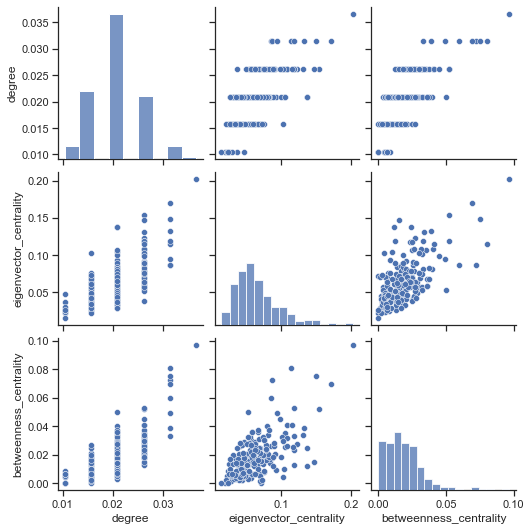

In [6]:
# visualization options
sns.set_theme(style="ticks")

# degree
degree = degree_centrality(g)

# eigenvector_centrality
ec = eigenvector_centrality(g)

# betweeness centrality
bc = betweenness_centrality(g)

# visualize results
# --+ df
df = pd.DataFrame({'degree': degree, 'eigenvector_centrality': ec,
                   'betweenness_centrality': bc})
# --+ correlation matrix
df.corr()

# --+ scatter plot matrix
sns.pairplot(df)


In [7]:
ai= dict(g.nodes(data='ai'))
ai.values()

dict_values([4, 4, 4, 4, 7, 4, 4, 5, 7, 10, 1, 2, 1, 3, 3, 8, 2, 6, 6, 7, 5, 8, 4, 3, 3, 4, 5, 1, 3, 3, 10, 10, 1, 3, 3, 5, 6, 1, 6, 4, 4, 3, 9, 10, 10, 2, 7, 4, 4, 6, 8, 10, 4, 4, 4, 8, 5, 6, 2, 4, 6, 7, 1, 5, 5, 6, 4, 3, 4, 5, 1, 5, 4, 6, 5, 6, 5, 6, 1, 3, 2, 2, 1, 4, 4, 7, 4, 6, 2, 2, 6, 2, 6, 7, 6, 7, 6, 9, 7, 3, 6, 3, 7, 5, 8, 3, 3, 4, 3, 4, 5, 5, 7, 3, 10, 4, 7, 5, 5, 3, 3, 7, 6, 5, 5, 6, 1, 2, 4, 6, 3, 8, 2, 2, 3, 7, 6, 10, 5, 3, 8, 4, 6, 3, 3, 4, 2, 4, 5, 3, 4, 9, 10, 7, 4, 5, 2, 3, 4, 4, 5, 5, 4, 8, 9, 2, 5, 8, 2, 1, 1, 7, 4, 4, 2, 5, 4, 2, 1, 4, 5, 4, 2, 3, 1, 4, 2, 10, 0, 8, 9, 6])

After having some basic knowledge regarding the network, we have plotted the physical layout of the individuals, in which the color represents their AI preference and the edges, the knowledge exchange.  We also plotted the knowledge network between the traders, in which the color represents their layout zone, the labels are the AI preferences and the node size represents their degree centrality. 

## Layout network plot

In [9]:
lst = dict(g.nodes(data='ai'))

In [10]:
color= list(lst.values())

<ipython-input-11-d3a17364da5c>:35: MatplotlibDeprecationWarning: The 'alpha' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  plt.colorbar(n, shrink=0.8, label='AI preference',location ='right', alpha=0.8)


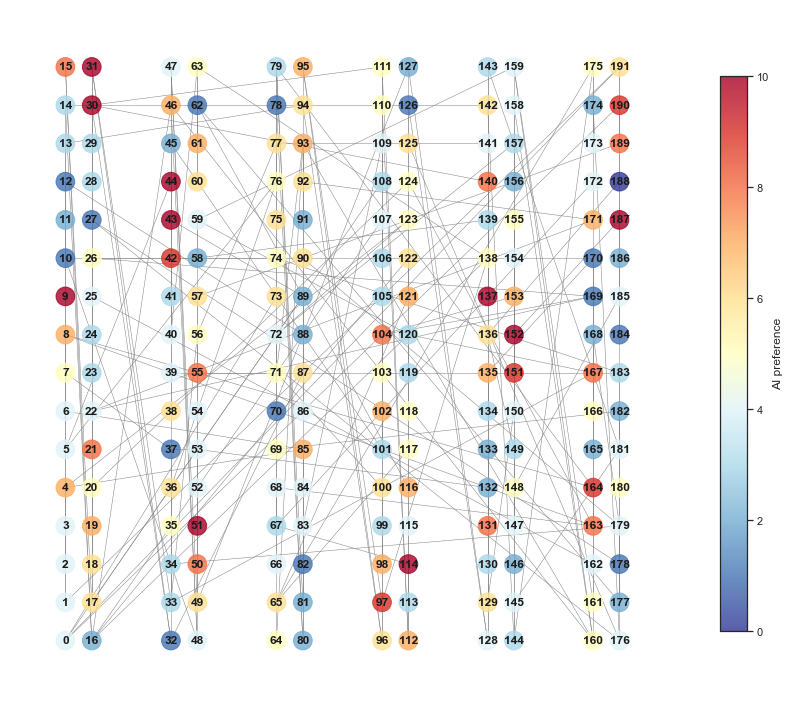

In [11]:
import matplotlib as mpl
from matplotlib import cm
from matplotlib.colors import ListedColormap,LinearSegmentedColormap



# Draw the layout network
fig = plt.figure(figsize=(12, 10))
g = nx.read_graphml('trading_floor.xml')
#im = ax.imshow(g.nodes(data='ai'))

x = dict([((k),d['x_pos']) for k, d in g.nodes(data=True)])
y = dict([((k),d['y_pos']) for k, d in g.nodes(data=True)])
keys = x.keys()
values = zip(x.values(), y.values())
pos = dict(zip(keys, values))
nx.set_node_attributes(g,pos, 'pos')

# color the nodes according to their ai preference
cmap = plt.get_cmap('RdYlBu_r')


# draw the network
nx.set_node_attributes(g,pos,'pos')

n = nx.draw_networkx_nodes(g, pos, node_color=color, cmap=cmap, vmin=0, vmax=10, node_size=350, alpha=0.8)

# node label
nx.draw_networkx_labels(g, pos, font_weight='semibold')

nx.draw_networkx_edges(g, pos, edge_color='grey', width=0.5)


plt.axis("off")
plt.colorbar(n, shrink=0.8, label='AI preference',location ='right', alpha=0.8)
plt.tight_layout()
plt.show()

## Knowledge network plot

We also plotted the knowledge network between the traders, in which the color represents their layout zone, the labels are the AI preferences and the node size represents their degree centrality. 

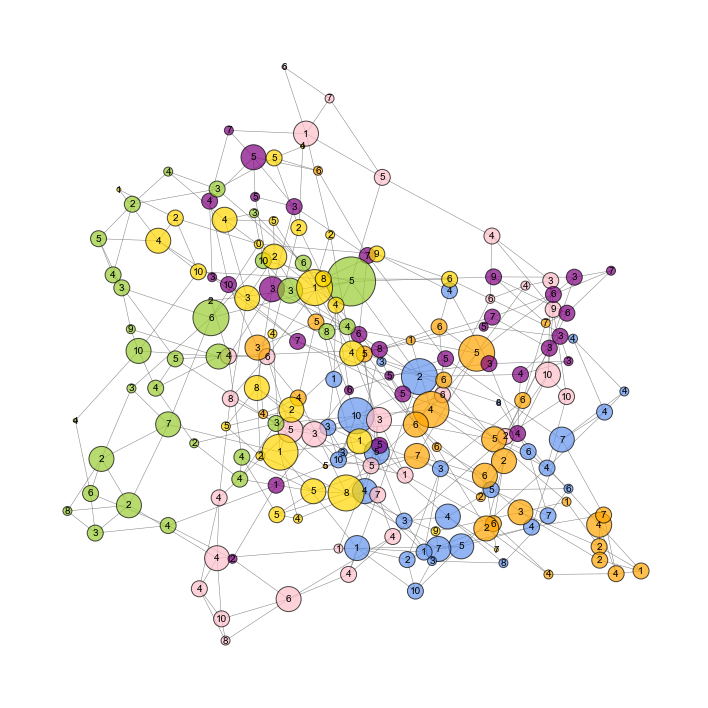

In [12]:
# read file and creat graph
fig = plt.figure(figsize=(10, 10))
# g = nx.read_graphml('trading_floor.xml')

# positions for all nodes - seed for reproducibility
pos = nx.spring_layout(g,seed=888)


# node colors according to the layout zone
colors = []
for value in x.values():
    if value == 1 or value == 2:
        colors.append('cornflowerblue')
    elif value == 5 or value == 6:
        colors.append('pink')
    elif value == 9 or value == 10:
         colors.append('orange')
    elif value == 13 or value == 14:
         colors.append('purple')
    elif value == 17 or value == 18:
         colors.append('yellowgreen')
    else:
        colors.append('gold')    


degrees = dict(g.degree)

# node size according to the degree of each node
nx.draw_networkx_nodes(g, pos, node_color=colors, node_size=[v ** 4 for v in degrees.values()], edgecolors='black', alpha=0.7)

#Label of the nodes according to the AI acceptance score
nx.draw_networkx_labels(g, pos, labels=nx.get_node_attributes(g, 'ai'),font_size=10, font_color='black')
  
nx.draw_networkx_edges(g, pos, width=0.5, edge_color='grey')

# show network
plt.axis("off")
plt.tight_layout()
plt.show()

In [13]:
# Average degree of the entire network
degree_df = pd.DataFrame(list(degrees.items()))
degree_df.rename(columns=dict(zip(degree_df.columns,['Node', 'Degree'])), inplace=True)
degree_df.set_index('Node')

degree_df.mean()

Node      inf
Degree    4.0
dtype: float64

## By zone analysis

To verify how the opinions of traders map on the physical layout, we started by analysing the zone properties of the floor. Generally, the average AI score per each layout zone was relatively low, between 4-5. We have run a regression to test the significance of zone layout to the AI preference, which results indicated that there was no significant effect. The similarity in AI score between nodes that were neighbours in the trading floor compared with those that were not, was neither significant from one-way ANOVA test. Therefore, there is no relationship between the desk position and the AI preference of people.

In [17]:
# Add zone atttribute to the nodes
for node,v in g.nodes(data='x_pos'):
          if v == 1 or v == 2:
             g.nodes[node]['zone'] = 1
          elif v == 5 or v == 6:
             g.nodes[node]['zone'] = 2
          elif v == 9 or v == 10:
             g.nodes[node]['zone'] = 3
          elif v == 13 or v == 14:
                 g.nodes[node]['zone'] = 4
          elif v == 17 or v == 18:
                 g.nodes[node]['zone'] = 5
          else:
               g.nodes[node]['zone'] = 6


In [18]:
zone1 = [x for x,y in g.nodes(data=True) if y['zone']==1]
zone2 = [x for x,y in g.nodes(data=True) if y['zone']==2]
zone3 = [x for x,y in g.nodes(data=True) if y['zone']==3]
zone4 = [x for x,y in g.nodes(data=True) if y['zone']==4]
zone5 = [x for x,y in g.nodes(data=True) if y['zone']==5]
zone6 = [x for x,y in g.nodes(data=True) if y['zone']==6]

In [19]:
# Mean of AI preference by zone
zone = {str(node):[g.nodes()[node]["zone"], g.nodes()[node]["ai"]] for node in g.nodes()}
df_zone = pd.DataFrame(zone).T
df_zone.rename(columns=(dict(zip(df_zone.columns,['zone','ai']))), inplace = True)
df_zone.groupby('zone').mean()

,ai
zone,
1,4.71875
2,5.06250
3,4.28125
4,5.00000
5,4.78125
6,4.28125


### Regression by zone

In [22]:
import statsmodels.api as sm

In [23]:
# Covert the zone variable into dummy variables for the regression
df_zone_d= pd.get_dummies(df_zone,drop_first=True,columns=['zone'])

# Define the predictor and response variables for the regression
X = df_zone_d.drop(columns=['ai'])
Y = df_zone_d[['ai']]

X = sm.add_constant(X) # In this package, by default, the regression will have no intercept, hence we need to manually add it to the X matrix, and call the result X_sm
lm = sm.OLS(Y, X).fit() # Fit an OLS with vector Y as dependent and matrix X_sm as independent
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                     ai   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                 -0.009
Method:                 Least Squares   F-statistic:                    0.6575
Date:                Fri, 17 Dec 2021   Prob (F-statistic):              0.656
Time:                        07:54:21   Log-Likelihood:                -435.25
No. Observations:                 192   AIC:                             882.5
Df Residuals:                     186   BIC:                             902.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.7188      0.419     11.252      0.0

/Users/xiawang/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [26]:
names=locals()

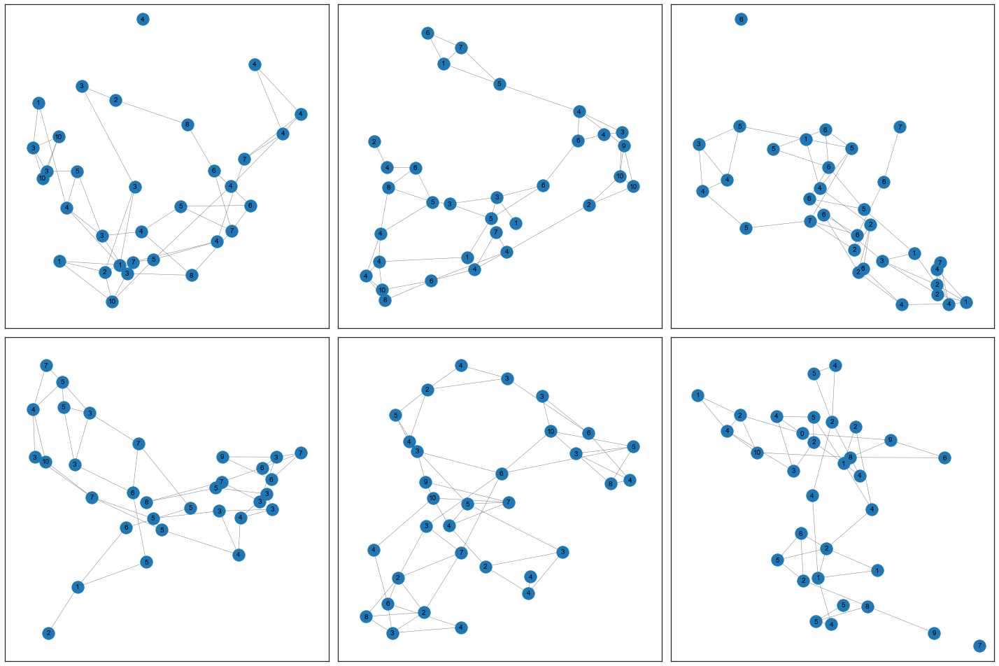

In [27]:
# Plot the network by zone, in subplots
fig = plt.figure(figsize=(20,20))
# g = nx.read_graphml('trading_floor.xml')

for i in range(1,7):
    names[f"G{i}"]=names[f"ax{i}"] = g.subgraph(names[f"zone{i}"])

for i in range(1,7):
    names[f"ax{i}"] = fig.add_subplot(3,3,i)
        

# positions for all nodes - seed for reproducibility
pos = nx.spring_layout(g, seed=888)

# plot the network in subplots
for  i in range(1,7):
    nx.draw_networkx_nodes(names[f"G{i}"], pos, ax=names[f"ax{i}"])

    #Label of the nodes according to the AI preference
    nx.draw_networkx_labels(names[f"G{i}"], pos,ax=names[f"ax{i}"], labels=nx.get_node_attributes(names[f"G{i}"], 'ai'), font_size=10, font_color='black')
  
    nx.draw_networkx_edges(names[f"G{i}"], pos, ax=names[f"ax{i}"],width=0.5, edge_color='grey')


# show network
plt.tight_layout()
plt.show()

## Neighbour similarity

In [ ]:
# create empty lists for each zone
x_1, x_2, x_5, x_6, x_9, x_10, x_13, x_14, x_17, x_18, x_21, x_22 =[[]]*12
score_1, score_2, score_5, score_6, score_9, score_10, score_13, score_14, score_17, score_18, score_21, score_22 = [[]]*12

# list of the zone numbers
lst = [1,2,5,6,9,10,13,14,17,18,21,22]


for node in g.nodes:
    if g.nodes[node]['x_pos'] == 1:
        x_1.append(node)
    elif g.nodes[node]['x_pos'] == 2:
        x_2.append(node)
    elif g.nodes[node]['x_pos'] == 5:
        x_5.append(node)
    elif g.nodes[node]['x_pos'] == 6:
        x_6.append(node)
    elif g.nodes[node]['x_pos'] == 9:
        x_9.append(node)
    elif g.nodes[node]['x_pos'] == 10:
        x_10.append(node)
    elif g.nodes[node]['x_pos'] == 13:
        x_13.append(node)
    elif g.nodes[node]['x_pos'] == 14:
        x_14.append(node)
    elif g.nodes[node]['x_pos'] == 17:
        x_17.append(node)
    elif g.nodes[node]['x_pos'] == 18:
        x_18.append(node)
    elif g.nodes[node]['x_pos'] == 21:
        x_21.append(node)
    elif g.nodes[node]['x_pos'] == 22:
        x_22.append(node)
   

In [ ]:
for i in lst:
    for ind, node in enumerate(names[f"x_{i}"]):
        if ind < len(names[f"x_{i}"]) -1:
            values = np.abs(g.nodes[names[f"x_{i}"][ind]]["ai"] - g.nodes[names[f"x_{i}"][ind+1]]["ai"])
            names[f"score_{i}"].append(values)


In [ ]:
g1 = nx.Graph()
g1.add_nodes_from(g)
g1.add_edges_from(edges)

# Similarity between nodes that are neighbour in the trading floors VS those ones that don't
neighbour = {}
for u,v in edges:
    key = "{}---{}".format(u,v)
    value = np.abs(g.nodes[u]["ai"] - g.nodes[v]["ai"])
    neighbour[key] = value
not_neighbour = {}
for u,v in edges:
    if u>v:
        key = "{}---{}".format(u,v)
        if key  not in edges:
            value = np.abs(g.nodes[u]["ai"] - g.nodes[v]["ai"])
            not_neighbour[key] = value

In [ ]:
# one-way anova test to see the significance
f_oneway(list(neighbour.values()),list(not_neighbour.values()))

F_onewayResult(statistic=0.21163083418771003, pvalue=0.6457214886905513)

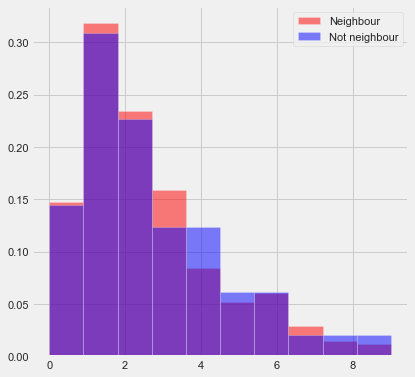

In [ ]:
# compare the distribution of similarity between nodes with edges vs without edges
n1 = list(neighbour.values())
n2 = list(not_neighbour.values())

fig3 = plt.figure(figsize=(6,6))
ax1 = fig3.add_subplot(111)
ax1.hist(n1 ,color='red', alpha=0.5, density=True, label='Neighbour')
ax1.hist(n2 ,color='blue', alpha=0.5, density=True, label='Not neighbour')
plt.legend()
plt.show()

# Knowledge network analysis

## Core-periphery

We made some analysis on the structure of the network and it did not present core-periphery. Regarding the community detection process, which the highest modularity score was on 14 communities however, due to the small number of nodes in the network, we have considered that by selecting 7 communities might show clearer patterns for the analysis. We tested the relationship between communities and AI preference through one-way ANOVA, which indicated that it was significant. 

In [28]:
# pip install hyppo

<AxesSubplot:>

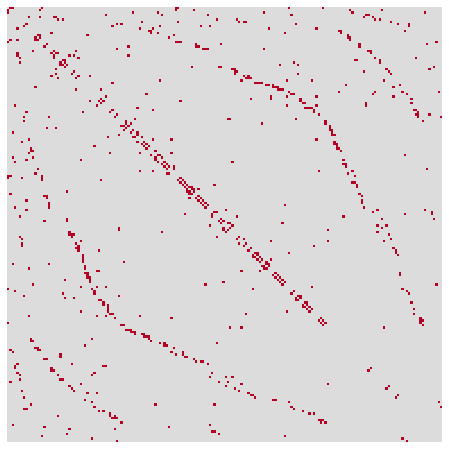

In [29]:
# Analyse the core-periphery structure of the newtork
import hyppo 
from hyppo.time_series import _utils as _utils 
from graspologic.plot import heatmap

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1)
heatmap(g,cmap='coolwarm', ax=ax, sort_nodes=True,cbar=False)

## Community

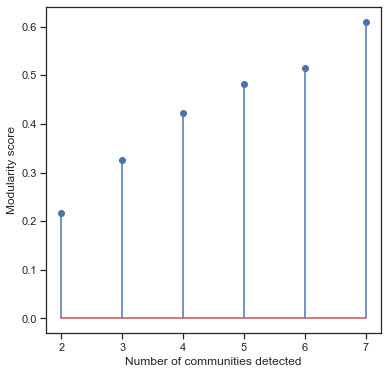

In [30]:
from networkx.algorithms.community import girvan_newman, modularity
import itertools
from pprint import pprint as pp

# use the modularity index to appreciate the quality of alternative 
# paritioning solutions
# fit
solutions = girvan_newman(g)

# alternative paritioning solutions to consider
k = 6

# register modularity scores
modularity_scores = dict()


# iterate over solutions
for community in itertools.islice(solutions, k):
    solution = list(sorted(c) for c in community)
    score = modularity(g, solution)
    modularity_scores[len(solution)] = score
    comm = solution

    
# plot modularity data
fig = plt.figure(figsize=(6,6))
pos = list(modularity_scores.keys())
values = list(modularity_scores.values())
ax = fig.add_subplot(1, 1, 1)
ax.stem(pos, values)
ax.set_xticks(pos)
ax.set_xlabel(r'Number of communities detected')
ax.set_ylabel(r'Modularity score')
plt.show()

In [31]:
key = range(1,8)
community= dict(zip(key,solution))

#Create new attribute regarding the community of each nodes
for k,v in community.items():
    for i in v:
        g.nodes[i]["comm"]=k

In [32]:
comm = {str(node):[g.nodes()[node]["comm"], g.nodes()[node]["ai"]] for node in g.nodes()}
df_comm = pd.DataFrame(comm).T
df_comm.rename(columns=(dict(zip(df_comm.columns,['community','ai']))), inplace = True)

# Compute the mean of ai preference by community
df_comm.groupby('community').mean()

,ai
community,
1,5.210526
2,4.555556
3,4.000000
4,4.897436
5,4.396825
6,6.000000
7,4.766667


In [34]:
dic = dict(g.nodes(data='comm'))
dic.values()

dict_values([1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 3, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 7, 7, 7, 7, 7, 7, 7, 7, 7, 4, 4, 4, 4, 4, 4, 4, 4, 4, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 5, 5, 5, 5, 5, 2, 5, 5, 5, 5, 5, 5, 3, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 7, 7, 7, 7, 7, 7, 7, 7])

#### Layout by community

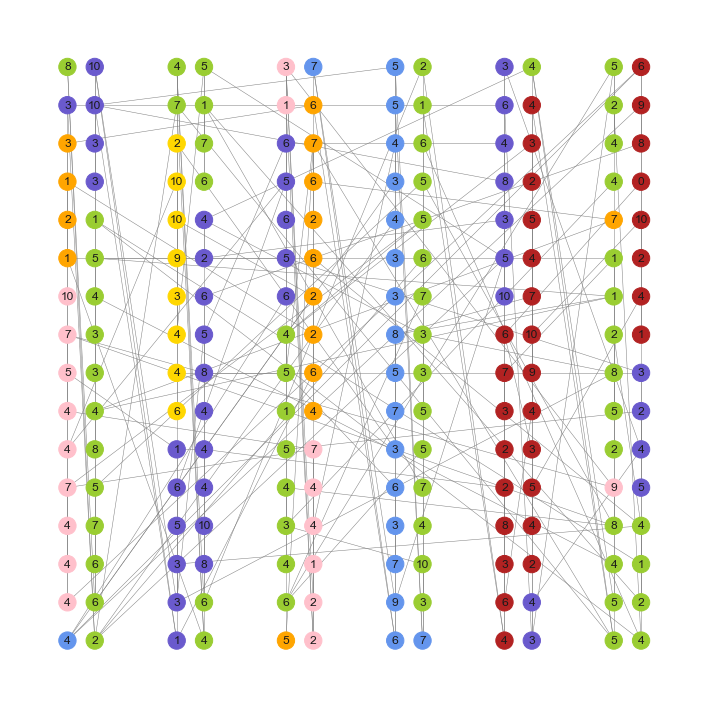

In [35]:
from pylab import rcParams
import matplotlib as mpl

# Draw the layout network
fig = plt.figure(figsize=(10, 10))
# g = nx.read_graphml('trading_floor.xml')
#im = ax.imshow(g.nodes(data='ai'))

x = dict([((k),d['x_pos']) for k, d in g.nodes(data=True)])
y = dict([((k),d['y_pos']) for k, d in g.nodes(data=True)])
keys = x.keys()
values = zip(x.values(), y.values())
pos = dict(zip(keys, values))
nx.set_node_attributes(g,pos, 'pos')

# color the nodes by their community
colors = []
for value in dic.values():
    if value == 1:
        colors.append('cornflowerblue')
    elif value == 2:
        colors.append('pink')
    elif value == 3:
         colors.append('orange')
    elif value == 4:
         colors.append('slateblue')
    elif value == 5:
         colors.append('yellowgreen') # yellowgreen
    elif value == 6:
         colors.append('gold')
    else:
        colors.append('firebrick')


# draw the network
nx.set_node_attributes(g,pos,'pos')

nx.draw_networkx_nodes(g, pos, node_color=colors)

nx.draw_networkx_labels(g, pos, labels=nx.get_node_attributes(g, 'ai'))
#nx.draw_networkx_labels(g, pos, labels=)

nx.draw_networkx_edges(g, pos, edge_color='grey', width=0.5)

plt.axis("off")
plt.tight_layout()
plt.show()

### One-way ANOVA

In [36]:
from scipy.stats import f_oneway

In [37]:
df_anova = df_comm.groupby('community', as_index=False).mean()
df_anova['new']= df_anova['community']-1
df_anova

,community,ai,new
0,1,5.210526,0
1,2,4.555556,1
2,3,4.000000,2
3,4,4.897436,3
4,5,4.396825,4
5,6,6.000000,5
6,7,4.766667,6


In [38]:
f_oneway(df_anova['new'], df_anova['ai'])

F_onewayResult(statistic=4.627788429278298, pvalue=0.052527838663081985)

## Community plot

In [39]:
for i in range(1,8):
    names[f"comm{i}"]= [x for x,y in g.nodes(data=True) if y['comm']==i]


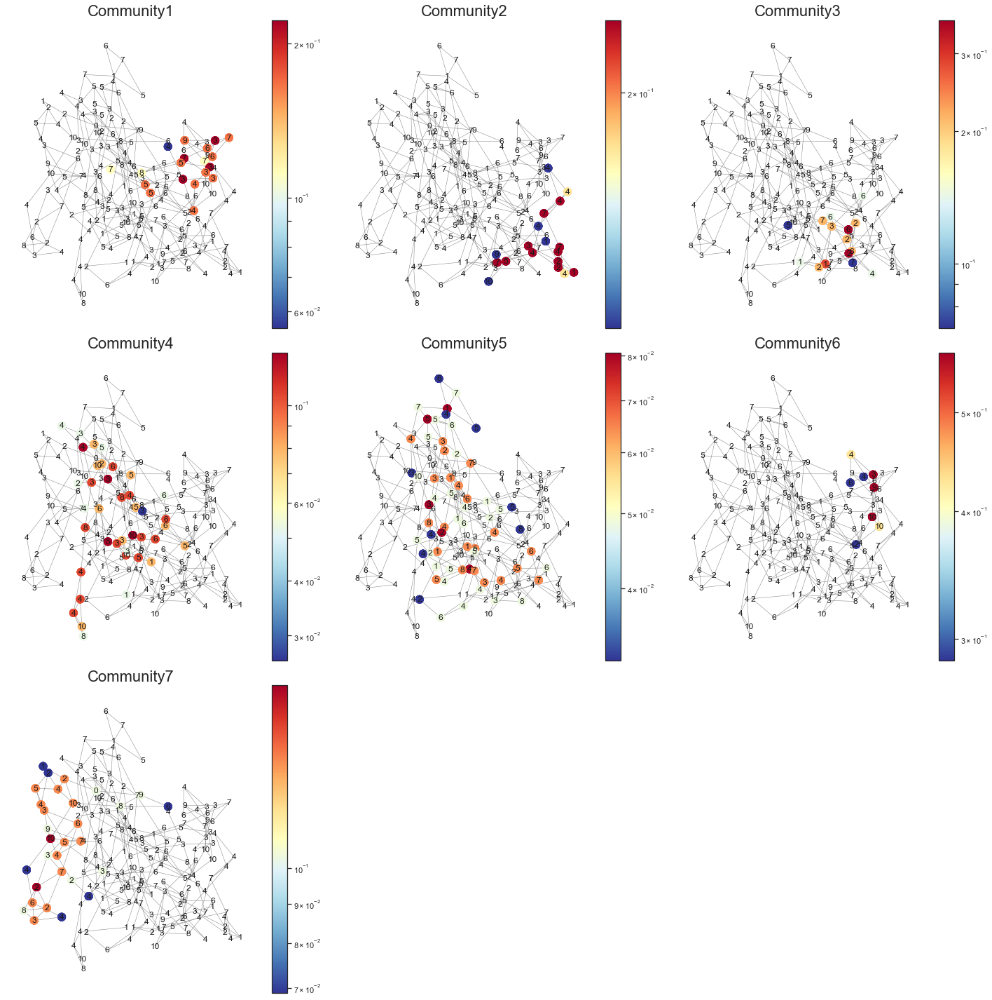

In [40]:
from collections import Counter
import matplotlib.colors as colors

fig = plt.figure(figsize=(20,20))
# g = nx.read_graphml('trading_floor.xml')

for i in range(1,8):
    names[f"G{i}"] = g.subgraph(names[f"comm{i}"])

for i in range(1,8):
    names[f"ax{i}"] = fig.add_subplot(3,3,i)


# positions for all nodes - seed for reproducibility
pos = nx.spring_layout(g, seed=888)


# Function to plot the graphs for each centrality metric
mpl.rcParams['figure.figsize']= [20,20]
def draw(g, pos, lista, listb, measure_name):
    for  i in range(1,8):
        nodes=nx.draw_networkx_nodes(names[f"G{i}"], pos, node_size=120, cmap=plt.cm.RdYlBu_r,node_color=lista,nodelist=listb)
        nx.draw_networkx_labels(names[f"G{i}"], pos,labels=nx.get_node_attributes(names[f"G{i}"], 'ai'))
        nodes.set_norm(colors.SymLogNorm(linthresh=0.01, linscale=1))
        edges=nx.draw_networkx_edges(names[f"G{i}"], pos, width=0.5, edge_color='grey' )
    plt.title(measure_name, fontsize=22, fontname='Arial')
    plt.colorbar(nodes)
    plt.axis('off')

# create sub-plot for each community
for n in range(1,8):
    list_pos_values = []
    plt.subplot(3,3,n)
    for i in nx.degree_centrality(names[f"G{n}"]).values():
        list_pos_values.append(i)
        list_pos_keys=[]
    for i in nx.degree_centrality(names[f"G{n}"]).keys():
        list_pos_keys.append(i)
    draw(names[f"G{n}"], pos, list_pos_values, list_pos_keys,f"Community{n}")


# show network
plt.tight_layout()
plt.show()

In [41]:
# Covert the column into dummy variables for the regression
df_comm_d= pd.get_dummies(df_comm,drop_first=True,columns=['community'])

# regression of ai preference in terms of the communities
X = df_comm_d.drop(columns=['ai'])
Y = df_comm_d[['ai']]

X = sm.add_constant(X) 
lm = sm.OLS(Y, X).fit() # Fit an OLS with vector Y as dependent and matrix X_sm as independent
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                     ai   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.005
Date:                Fri, 17 Dec 2021   Prob (F-statistic):              0.424
Time:                        07:54:32   Log-Likelihood:                -433.85
No. Observations:                 192   AIC:                             881.7
Df Residuals:                     185   BIC:                             904.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           5.2105      0.542      9.618      

/Users/xiawang/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [42]:
f_oneway(df_comm['community'], df_anova['ai'])

F_onewayResult(statistic=0.5815906106373839, pvalue=0.4466017020810449)

## Homophily

We study as well homophily, by adding attribute of adopting to the nodes according to their AI preference (score above 5 were considered as adopting). After applying the Girvan-Newman algorithm, we reached to the result that there is existence of homophily within the network. 

In [43]:
#Adding attributes to the nodes to test the homophily
for node in g.nodes:
    if g.nodes[node]["ai"]>5:
        g.nodes[node]["adopting"] = 1
    else:
        g.nodes[node]["adopting"] = 0

In [44]:
# The number of individuals that likes and does not like AI
like = [x for x,y in g.nodes(data=True) if y['adopting']==1]
print("Like AI",len(like))
no_like = [x for x,y in g.nodes(data=True) if y['adopting']==0]
print("No like AI",len(no_like))

Like AI 64
No like AI 128


In [45]:
#Obtain the edges between nodes
edges = dict(g.edges)
edges_info = edges.keys()
edges_ls = [k for k in edges.keys()]
df_edges = pd.DataFrame (edges_ls, columns = ['node1', 'node2'])

# nodes with edges and their ai preference
adopt = nx.get_node_attributes(g,'adopting')
adopt_ls_nodes = [k for k in adopt.keys()]
adopt_ls = [k for k in adopt.values()]

c={"node1" : adopt_ls_nodes,
   "adopt1" : adopt_ls}

adopt1=pd.DataFrame(c)

c2={"node2" : adopt_ls_nodes,
   "adopt2" : adopt_ls}

adopt2=pd.DataFrame(c2)

df_merge = df_edges.merge(adopt1, how='left') 
df_merge = df_merge.merge(adopt2, how='left')
df_merge["score"] = df_merge["adopt1"] + df_merge["adopt2"]
df_merge


,node1,node2,adopt1,adopt2,score
0,0,191,0,1,1
1,0,190,0,1,1
2,0,108,0,0,0
3,0,73,0,1,1
4,1,2,0,0,0
...,...,...,...,...,...
379,187,189,1,1,2
380,188,190,0,1,1
381,189,190,1,1,2
382,189,191,1,1,2


In [46]:
g1 = nx.to_numpy_matrix(g)

--------------------------------------------------------------------------------
Descriptive statistics on observed-simulated distances
--------------------------------------------------------------------------------
Mean: 0.01
Std. dev.: 0.0
Min: 0.0
Max: 0.01


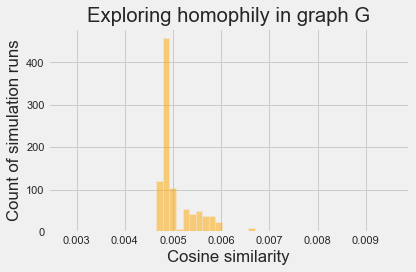

In [47]:
# Homophily in the networks

# %% load libraries
import pickle
from scipy.spatial.distance import pdist

# %% style issues
plt.style.use('fivethirtyeight')

# %% simulate the observed network data
# seed
np.random.seed(888)
# nodes
n = 192
# proportion of nodes that have ai preference >5
p = 64/192

# tie formation probabilities
p_aino = p*(1-p)
p_aiai = p**2
p_nono = (1-p)**2

_g = g1
_p = p

# count of ties
c_aiai = len(df_merge[df_merge["score"]==2])
c_nono = len(df_merge[df_merge["score"]==0])
c_aino = len(df_merge[df_merge["score"]==1])


# %% compare the focal network against 1,000 simulated networks
# define function
def assess_hompohily(_g,
                     _p,
                     _n,
                     _c_aiai, _c_nono, _c_aino,
                     _n_iterations):
    '''
    :param _g: observed network (adjaceny matrix -- pass  a Numpy array)
    :param _p: proportion of gender = female nodes in the network
    :param _n: count of nodes in network
    :param _c_ff: count of female-female ties in the observed network
    :param _c_mm: count of male-male ties in the observed network
    :param _c_fm: count of female - male ties in the observed network
    :param _n_iterations: count
    :return: list of cosine similarity scores along with descriptive
             statistics
    '''
    # fix seed
    np.random.seed(888)
    # containers
    # --+ count ties by type (homophilous Vs heterophilous)
    _r_aiai, _r_aino, _r_nono = 0, 0, 0
    # --+ distance between observed and simulated data
    _dist = []
    # iterate over simulated distribution of genders
    for iteration in range(_n_iterations):
        # --+ reshuffling the gender of nodes; gender = female is coded as 1
        _reshuffled = np.random.binomial(1, p, size=n)
        # --+ iterate over each dyad in g
        for i in range(n):
            for j in range(n):
                # --+ sample the tie in the network
                t =g1[i,j]
                # --+ if tie is present, evaluate whether it's a homphilous or
                # --- heterophilous tie based on the reshuffled network
                if t == 1:
                    h = np.sum([_reshuffled[i], _reshuffled[j]])
                    if h == 2:
                        _r_aiai += 1
                    elif h == 1:
                        _r_aino += 1
                    elif h == 0:
                        _r_nono += 1
                    else:
                        pass
                else:
                    pass
        # get the distance between the observed and simulated distribution
        # of ties with respect to three following categories: (i)
        # female-female; (ii) female-male; (iii) male-male. Scipy doc is the
        # place start to get a closer understanding of `cosine similarity'
        # as a distance metric (see scipy.spatial.distance).
        _observed = np.array([c_aiai, c_aino, c_nono])
        _simulated = np.array([_r_aiai, _r_aino, _r_nono])
        to_append = pdist([_observed, _simulated], metric='cosine')
        _dist.append(to_append[0])
    # return statistics on the distance between the observed and siimulated
    # distributions of ties with respect to type (homophilopus Vs.
    # heterophilous)
    # --+
    _mean, _std, _min, _max = np.mean(_dist), np.std(_dist),\
                              np.min(_dist), np.max(_dist)
    print(80 * '-',
          'Descriptive statistics on observed-simulated ' \
          'distances',
          80 * '-',
          'Mean: %s' % np.round(_mean, 2),
          'Std. dev.: %s' % np.round(_std, 2),
          'Min: %s' % np.round(_min, 2),
          'Max: %s' % np.round(_max, 2),
          end='\n',
          sep='\n')
    # --+ plot the distribution of sum of squares
    fig = plt.figure(figsize=(6, 4))
    ax = fig.add_subplot(1, 1, 1)
    ax.hist(_dist,
            bins=50, cumulative=False, density=False,
            color='orange', alpha=0.5,
            histtype='bar')
    ax.set_xlabel(r'Cosine similarity')
    ax.set_ylabel(r'Count of simulation runs')
    ax.set_title(r'Exploring homophily in graph G')
    # --+ save figure
    plt.tight_layout()
    plt.savefig('cosine_sim_distr.pdf')
    # --+ return objects
    return(_dist, [_mean, _std, _min, _max])


# %% deploy function
outcome = assess_hompohily(_g=g1, _p=p, _n=n,
                           _c_nono=c_nono, _c_aiai=c_aiai, _c_aino=c_aino,
                           _n_iterations=1000)


## K-means

In [79]:
#Do the K-means to cluster the individuals according to their AI preference and their degree centrality.

In [56]:
from collections import Counter
from sklearn.cluster import KMeans

#obtaining the ai preference for each node
degree_centrality = nx.degree_centrality(g)
df_degree = pd.DataFrame(dict(Counter(degree_centrality).most_common(192)), index=[0]).T.reset_index()
df_ai = pd.DataFrame(dict(g.nodes(data="ai")), index=[0]).T.reset_index()

df_result = df_ai.merge(df_degree,on="index")
df_result.rename(columns={'index': 'nodes'}, inplace=True)


# K-means
kmeanModel = KMeans(n_clusters=2, random_state=1).fit(df_result)
labels = kmeanModel.labels_
df_result["cluster"] = labels

# Obtaining the cluster of each node
cluster_1 = df_result[df_result["cluster"]==1].sort_values(by="0_y",ascending=False)
cluster_0 = df_result[df_result["cluster"]==0].sort_values(by="0_y",ascending=False)
cluster= pd.concat([cluster_1,cluster_0])

# Obtaining the community of each node
comm_df = pd.DataFrame(dict(g.nodes(data= "comm")), index=[0]).T.reset_index()
comm_df.rename(columns={'index': 'nodes'}, inplace=True)
df_result = cluster.merge(comm_df,on="nodes")

df_result.rename(columns={0: 'comm'}, inplace=True)
df_result.rename(columns={'0_x': 'ai_score'}, inplace=True)
df_result.rename(columns={'0_y': 'DC'}, inplace=True)


# Verify the nodes and their degree centrality in each community
comm_result = df_result[df_result['comm']==5]
comm_result[comm_result['cluster']==1].sort_values(by="DC",ascending=False)


,nodes,ai_score,DC,cluster,comm
0,16,2,0.031414,1,5
2,71,5,0.031414,1,5
3,72,4,0.031414,1,5
4,49,6,0.026178,1,5
5,67,3,0.026178,1,5
6,62,1,0.026178,1,5
7,26,5,0.026178,1,5
8,25,4,0.026178,1,5
9,22,4,0.026178,1,5
71,19,7,0.020942,1,5


## Diffusion and Cascading Model

From the results obtained from all the analysis, we can design the cascading model for the diffusion of AI preference.  In this case, we have considered 6 different scenarios for simulation based on the properties of the network and to different criteria of selection of the early adopters:
1)	Individuals with high degree in the whole network
2)	Nodes with high degree in each community
3)	Nodes with high degree in Cluster 1 and
4)	Cluster 0 in the whole network 
5)	Nodes with high degree in Cluster 1 and 
6)	Cluster 0 by each community 

All the scenarios are under the assumption that the selected early adopters have been convinced to diffuse the use of AI at work.

The cascading model is based on selecting different nodes as early adopters and individuals will adopt in the case that the payoff of adopting is larger than the payoff of not adopting. In this case, the payoff of adopting is determined by the number of neighbours that have adopted multiplied by their personal payoffs, which depends on their AI preference. The simulation will stop when no more nodes are added as adopters. 


In [57]:
# pip install plotly

In [58]:
from plotly import graph_objects as go


def diffusion(adop_nodes):
    early_adopter = adop_nodes


    for node in g.nodes():
        g.nodes[node]['degree'] = g.degree(node)

    # set the payoffs of each individual
    for nodes in g.nodes:
        g.nodes[nodes]['payoff_a'] = g.nodes[nodes]["ai"] 

    for nodes in g.nodes:
        g.nodes[nodes]["payoff_b"] = 10-g.nodes[nodes]["ai"]
        

    g_list = []
    adopters = early_adopter
    
    # clean the existent adopting attribute used for assessing homophily
    for node in g.nodes:
        g.nodes[node]['adopting'] = 0

    # set earlier adopter
    for adopter in adopters:
        g.nodes[adopter]['adopting'] = 1

        
    last_adopters = None
    while last_adopters != adopters:
        # set empty set for new adopters
        new_adopters = set()
        # node color according to the adoption        
        for nodes in g.nodes:
            if g.nodes[nodes]['adopting'] == 1:
                g.nodes[nodes]['color'] = 'orange'
            else:
                g.nodes[nodes]['color'] = 'cornflowerblue'

        # save the status of the network
        g_list.append(g.copy())

        # update the network
        for focal in g.nodes:
        # count the adopting neighbours
            focal_nbrs = list(g.neighbors(focal))
            p = np.sum([g.nodes[nbr]['adopting'] for nbr in focal_nbrs])
            # pay-off of adopting new behavior
            d = g.degree(focal)
            # the payoff of adopting new behaviour is influenced by the degree of neighbour degree
            a_payoff = p * g.nodes[focal]["payoff_a"] 
            b_payoff = (d - p) * g.nodes[focal]["payoff_b"]
            # decision to adopt
            if (g.nodes[focal]['adopting'] == 0) & (a_payoff > b_payoff):
                new_adopters.add(focal)
                
            else:
                pass
    # update the adopters in the network
        for node in new_adopters:
            g.nodes[node]['adopting'] = 1

        last_adopters = adopters
        adopters = adopters.union(new_adopters)

        # Dynamic graph of the diffusion process
    def create_edge_trace(G):
        # collect edges information from G to plot
        edge_weight = []
        edge_text = []
        edge_pos = []
        edge_color = []
        
        for edge in G.edges(data=True):
            
            # edge is line connecting two points
            x0, y0 = G.nodes[edge[0]]['x_pos'],G.nodes[edge[0]]['y_pos']
            x1, y1 = G.nodes[edge[1]]['x_pos'],G.nodes[edge[1]]['y_pos']
            edge_pos.append([[x0, x1, None], [y0, y1, None]])
            
            # edge line color when drawn
            edge_color.append("black")

        # there is a trace for each edge
        edge_traces = []
        for i in range(len(edge_pos)):
            
            # edge line width
            line_width = 1

            # it is scatter because it's a line connecting two points
            trace = go.Scatter(
                x=edge_pos[i][0], y=edge_pos[i][1],
                line=dict(width=line_width, color=edge_color[i]),
                mode='lines',
                visible=False
            )
            edge_traces.append(trace)

        return edge_traces

    def create_node_trace(G):
        # collect node information from G to plot
        node_x = []
        node_y = []
        node_text = []
        node_color = []

        for i, node in enumerate(G.nodes(data=True)):
            # get node x,y positions and store
            x, y = node[1]['x_pos'],node[1]['y_pos']
            node_x.append(x)
            node_y.append(y)

            node_text.append(node[0])
            node_color.append(node[1]['color'])

        # create node trace (i.e., scatter plot)
        # make it invisible by default
        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers',
            hoverinfo='text',
            marker=dict(
                showscale=False,
                color=node_color,
                size=16,
                line_width=0.5,
            ),
            text=node_text,
            visible=False
        )

        return node_trace
    
    
    def get_interactive_slider_similarity_graph(slide_value, node_text=None, yaxisrange=None, xaxisrange=None):
        
        # Create figure with plotly
        fig = go.Figure()

        # key: slider value
        # value: list of traces to display for that slider value
        slider_dict = {}
        
        # total number of traces
        total_n_traces = 0

        # for each possible value in the slider, create and store traces (i.e., plots)
        for i, step_value in enumerate(slide_value):

            # update similarity matrix for the current step
            # create nx graph from sim matrix
            G = g_list[i]
            
            # assign node positions if None
            node_pos = nx.spring_layout(G)


            # create edge taces (each edge is a trace, thus this is a list)
            edge_traces = create_edge_trace(G)
            
            # create node trace (a single trace for all nodes, thus it is not a list)
            node_trace = create_node_trace(G) 

            # store edge+node traces as single list for the current step value
            slider_dict[step_value] = edge_traces + [node_trace]
            
            # keep count of the total number of traces
            total_n_traces += len(slider_dict[step_value])

            # make sure that the first slider value is active for visualization
            if i == 0:
                for trace in slider_dict[step_value]:
                    # make visible
                    trace.visible = True

                    
        # Create steps objects (one step per step_value)
        steps = []
        for step_value in slide_value:
            
            # count traces before adding new traces
            n_traces_before_adding_new = len(fig.data)
            
            # add new traces
            fig.add_traces(slider_dict[step_value])

            step = dict(
                # update figure when this step is active
                method="update",
                # make all traces invisible
                args=[{"visible": [False] * total_n_traces}],
                # label on the slider
                label=str(round(step_value, 3)),
            )

            # only toggle this step's traces visible, others remain invisible
            n_traces_for_step_value = len(slider_dict[step_value])
            for i in range(n_traces_before_adding_new, n_traces_before_adding_new + n_traces_for_step_value):
                step["args"][0]["visible"][i] = True
            
            # store step object in list of many steps
            steps.append(step)

        # create slider with list of step objects
        slider = [dict(
            active=0,
            steps=steps
        )]

        # add slider to figure and create layout
        fig.update_layout(
            sliders=slider,
            showlegend=False,
            hovermode='closest',
            margin=dict(b=20, l=5, r=5, t=40),
            xaxis=dict(range=xaxisrange, showgrid=False, zeroline=False, showticklabels=False),
            yaxis=dict(range=yaxisrange, showgrid=False, zeroline=False, showticklabels=False),
            width=700, height=700,
        )

        return fig

    # define slider steps (i.e., threshold values)
    slider_steps = list(range(len(g_list)))
        
    # get the slider figure
    fig = get_interactive_slider_similarity_graph(
        slider_steps,

    )

    # plot it
    fig.show()
    return pd.DataFrame(dict(g_list[-1].nodes.data())).T, g_list

    

In [59]:
# set ealier adopter under different situations
# setting as early adopters the nodes with high degree in the whole network
adop_nodes1 = set(["138","16","30","71","72","136","163","170","178","4","7","8","10","22"])
df_1,g_list1= diffusion(adop_nodes1)


In [68]:
# # setting as early adopters the nodes with high degree in each community (2 per community)
adop_nodes2 = set(["99","4","88","139","62","42","133","102","79","92","181","25","152"])
df_2,g_list2= diffusion(adop_nodes2)


In [69]:
# # setting as early adopters the nodes with high degree nodes in cluster 1 (the whole network)
adop_nodes3 = set(['138', '170', '72', '71', '178', '16', '179', '181', '133', '132', '88','53', '120', '56'])
df_3,g_list3= diffusion(adop_nodes3)

In [70]:
# # setting as early adopters the nodes with high degree nodes in cluster 0 (the whole network)
adop_nodes4 = set(['163', '136', '30', '4', '43', '8', '77', '49', '92', '135', '93','152', '153', '167'])
df_4,g_list4= diffusion(adop_nodes4)


In [71]:
# # setting as early adopters the nodes with high degree in cluster 1 by community (2 nodes per community)
adop_nodes5 = set(["0",'79','83','89','93','30','76','77','16','71','72','49','43','40'])
df_5,g_list5= diffusion(adop_nodes5)

In [72]:
 # # setting as early adopters the nodes with high degree nodes in cluster 0 by community (2 nodes per community)
adop_nodes6 = set(["96",'105','164','171','138','181','183','182','139','170','178','163','117','120'])
df_6,g_list6= diffusion(adop_nodes6)

## Comparison between Models

Generally, the output is not outstanding, since the number of adopters in all the scenarios are not relatively large. In case that the company wants to diffuse positive AI opinions across the trading floor in the less time possible, it can apply Scenario 2, which within 4 loops it can persuade 42 individuals to diffuse AI. But, if the company wants to achieve the maximum number of people that rates positively AI, then it can apply Scenario 3. 

In [75]:

d = {'Number of adopters':[(df_1['adopting']==1).sum(), (df_2['adopting']==1).sum(), (df_3['adopting']==1).sum(),
        (df_4['adopting']==1).sum(), (df_5['adopting']==1).sum(), (df_6['adopting']==1).sum()],
    'Loops': [len(g_list1) -1, len(g_list2) -1, len(g_list3) -1, len(g_list4) -1,len(g_list5) -1, len(g_list6) -1],
    'Efficiency': [(df_1['adopting']==1).sum()/(len(g_list1) -1), (df_2['adopting']==1).sum()/(len(g_list2) -1), 
        (df_3['adopting']==1).sum()/(len(g_list3) -1), (df_4['adopting']==1).sum()/(len(g_list4) -1), 
        (df_5['adopting']==1).sum()/(len(g_list5) -1), (df_6['adopting']==1).sum()/(len(g_list6) -1)],
    'Scenario':[1,2,3,4,5,6]}

df_comp = pd.DataFrame(d)
df_comp.set_index('Scenario', inplace=True)
df_comp

,Number of adopters,Loops,Efficiency
Scenario,,,
1,36,6,6.000000
2,42,4,10.500000
3,50,10,5.000000
4,30,4,7.500000
5,37,7,5.285714
6,29,3,9.666667


In [66]:
#Model 3: highest number of adopters
# Descriptive statistics of those individuals that didn't adopt
df_noadopt3 = df_3[df_3["adopting"]==0] # not adopt
pd.DataFrame(dict(g_list3[-1].nodes.data())).T["adopting"].sum(),(len(g_list3)-1), df_noadopt3.mean()

<ipython-input-66-2d407ca77232>:4: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



(50,
 10,
 ai           4.225352
 x_pos       10.964789
 y_pos        7.570423
 zone         3.373239
 comm         4.295775
 adopting     0.000000
 degree       3.880282
 payoff_a     4.225352
 payoff_b     5.774648
 dtype: float64)

In [77]:
#Model 5: most efficient
# Descriptive statistics of those individuals that didn't adopt
df_noadopt2 = df_2[df_2["adopting"]==0] # not adopt
pd.DataFrame(dict(g_list2[-1].nodes.data())).T["adopting"].sum(),(len(g_list2)-1), df_noadopt2.mean()

<ipython-input-77-045ef9cc55fe>:4: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



(42,
 4,
 ai           4.120000
 x_pos       11.180000
 y_pos        7.033333
 zone         3.420000
 comm         4.400000
 adopting     0.000000
 degree       3.973333
 payoff_a     4.120000
 payoff_b     5.880000
 dtype: float64)

The main obstacle for the diffusion of AI preference in the network is mainly caused by the low score across the whole network. The average AI score was around 4, which means that in general, people are in the stage of rejecting the use of AI at work. The structure of the network does not either favour the diffusion, since the existence of core nodes might boost its process. The insignificance of physical layout to the preference also limits the effectiveness as people might interact more with their neighbours. 

To promote the diffusion of AI across trading floor, it is highly recommended to increase firstly the average AI preference among all the individuals through the interaction between those who have high AI preference with the low scored ones. Once the general level of AI preference has increased, to near 5 for example, then the company can apply other methods to enhance its diffusion. One of it could be persuading individuals that are having large connections with other traders the advantages of using AI, through training programs, for instance. Once they change their opinion, it would be easier to change the mind of those who are sharing knowledge mutually.